In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
df_churn = pd.read_csv('Datasets/churn.csv')
df_customer = pd.read_csv('Datasets/customer.csv')
df_orders = pd.read_csv('Datasets/orders.csv')
df_products = pd.read_csv('Datasets/products.csv')
df_promotions = pd.read_csv('Datasets/promotions.csv')
my_df_list = [df_churn, df_customer, df_orders, df_products, df_promotions] 
my_dfs_name = ['df_churn', 'df_customer', 'df_orders', 'df_products', 'df_promotions']

In [5]:
# info (check dtypes, null)
for index,i in enumerate(my_df_list):
    print(my_dfs_name[index],':\n' , i.info(),'\n-------------------------------------------------\n')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CustomerID              2000 non-null   int64  
 1   Gender                  2000 non-null   object 
 2   Age                     2000 non-null   int64  
 3   Annual Income ($)       2000 non-null   int64  
 4   Profession              1965 non-null   object 
 5   Work Experience         2000 non-null   int64  
 6   Family Size             2000 non-null   int64  
 7   City                    2000 non-null   object 
 8   LastPurchaseDate        2000 non-null   object 
 9   FirstPurchaseDate       2000 non-null   object 
 10  TotalPurchases          2000 non-null   int64  
 11  TotalAmount             2000 non-null   float64
 12  TotalQuantity           2000 non-null   int64  
 13  Recency                 2000 non-null   int64  
 14  TimeSinceFirstPurchase  2000 non-null   

In [6]:
# converting date columns to datetime format
df_churn.FirstPurchaseDate = pd.to_datetime(df_churn.FirstPurchaseDate)
df_churn.LastPurchaseDate = pd.to_datetime(df_churn.LastPurchaseDate)
df_orders.Purchase_Date = pd.to_datetime((df_orders.Purchase_Date))
df_products.Release_Date = pd.to_datetime(df_products.Release_Date)
df_promotions.StartDate = pd.to_datetime(df_promotions.StartDate)
df_promotions.EndDate = pd.to_datetime(df_promotions.EndDate)

In [7]:
#duplicate check
# null check
for index,i in enumerate(my_df_list):
    print(my_dfs_name[index],':' , i.duplicated().sum())


df_churn : 0
df_customer : 0
df_orders : 0
df_products : 0
df_promotions : 0


In [8]:
#Sanity check
for index,i in enumerate(my_df_list):
    print(my_dfs_name[index],':\n')
    categorical_columns = i.select_dtypes('object').columns
    for j in categorical_columns:
        print(j)
        print(i[j].unique())
    print('-------------------------------------------------\n')


df_churn :

Gender
['Male' 'Female']
Profession
['Healthcare' 'Engineer' 'Lawyer' 'Entertainment' 'Artist' 'Executive'
 'Doctor' 'Homemaker' 'Marketing' nan]
City
['Raleigh' 'Detroit' 'San Antonio' 'Tulsa' 'Fort Worth' 'Dallas'
 'San Francisco' 'Tucson' 'Colorado Springs' 'Fresno' 'Baltimore'
 'Wichita' 'Indianapolis' 'Oakland' 'New Orleans' 'Houston' 'El Paso'
 'Kansas City' 'Milwaukee' 'Charlotte' 'Virginia Beach' 'Omaha'
 'Louisville' 'Albuquerque' 'San Diego' 'Minneapolis' 'Oklahoma City'
 'Washington' 'Boston' 'Phoenix' 'Miami' 'Atlanta' 'Las Vegas'
 'Philadelphia' 'Sacramento' 'Memphis' 'Nashville' 'Columbus' 'Austin'
 'Mesa' 'Long Beach' 'Los Angeles' 'Seattle' 'Arlington' 'Jacksonville'
 'San Jose' 'New York' 'Denver' 'Chicago' 'Portland']
-------------------------------------------------

df_customer :

Gender
['Male' 'Female']
Profession
['Healthcare' 'Engineer' 'Lawyer' 'Entertainment' 'Artist' 'Executive'
 'Doctor' 'Homemaker' 'Marketing' nan]
City
['Raleigh' 'Detroit' 'San

## RFM calculation
- Recency: date of observation - LastPurchaseDate
- Frequency: TotalPurchases / TimeSinceFirstPurchase
- Monetary value: TotalAmount / TotalQuantity

# Plots

- 1.	`Brand and Category Promotions Count`

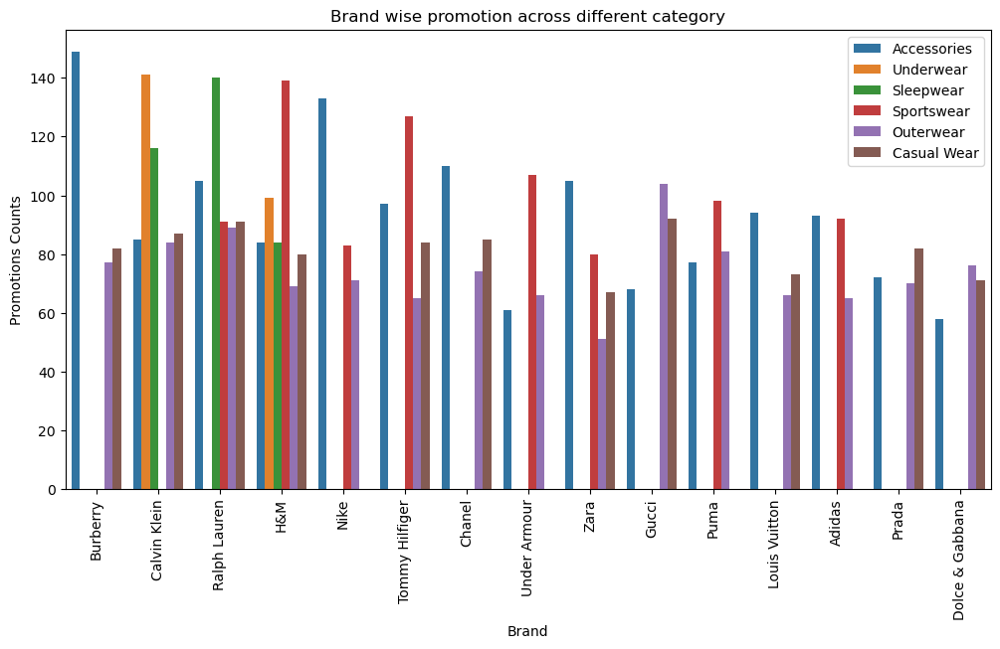

In [9]:
#•	How many promotions are run by each brand across different product categories?
temp =  pd.DataFrame(df_promotions.groupby(['Brand','Category'])['PromotionID'].count()).reset_index().sort_values(by='PromotionID',ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(data=temp, x= 'Brand', y= 'PromotionID', hue = 'Category')
plt.xticks(rotation=90)
plt.ylabel('Promotions Counts')
plt.title('Brand wise promotion across different category')
plt.legend(loc='upper right')
plt.show()

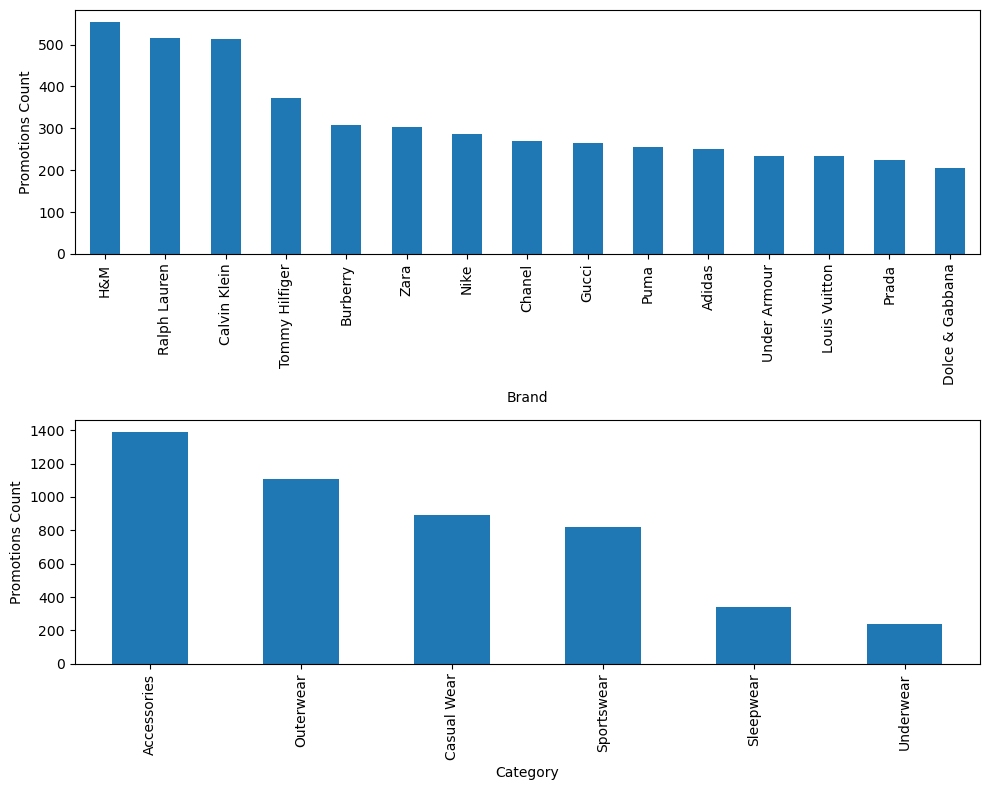

In [10]:
#•	Which brands and categories have the highest number of promotions?

plt.figure(figsize=(10, 8))

# First subplot
plt.subplot(211)
ax1 = pd.DataFrame(df_promotions.groupby('Brand')['PromotionID'].count()) \
        .sort_values(by='PromotionID', ascending=False) \
        .plot(kind='bar', ax=plt.gca())  # Using plt.gca() to get the current axes
plt.legend().remove()
plt.ylabel('Promotions Count')

# Second subplot
plt.subplot(212)
ax2 = pd.DataFrame(df_promotions.groupby('Category')['PromotionID'].count()) \
    .sort_values(by='PromotionID', ascending=False) \
    .plot(kind='bar', ax=plt.gca())  # Using plt.gca() to get the current axes
plt.legend().remove()
plt.ylabel('Promotions Count')

plt.tight_layout()  
plt.show()

- 2.	`Brand and Category Sales Change Percentage`

- What is the percentage change in sales for each brand and category before and after promotions?
- Identify the brands and categories with the most significant positive and negative changes in sales percentage.
- Generate a plot that compares the percentage change in sales across brands and categories.

In [11]:
#merging ORDER and PROMOTION data 
temp_order_promotion = pd.merge(df_orders, df_promotions, on=['PromotionID', 'Brand', 'Category'], how = 'left')
temp_order_promotion['Purchase_Year_Month'] = temp_order_promotion.Purchase_Date.dt.to_period('M')
temp_order_promotion['Brand_Category']  = temp_order_promotion.Brand+'-'+temp_order_promotion.Category
temp_no_promo = pd.DataFrame(temp_order_promotion[temp_order_promotion.PromotionID.isna()].groupby(['Brand','Category','Brand_Category','Purchase_Year_Month'])['Total_Amount'].sum()).reset_index()
temp_promo = pd.DataFrame(temp_order_promotion[~temp_order_promotion.PromotionID.isna()].groupby(['Brand','Category','Brand_Category','Purchase_Year_Month'])['Total_Amount'].sum()).reset_index()
temp = pd.merge(temp_no_promo,temp_promo, on = ['Brand','Category','Brand_Category','Purchase_Year_Month'], how  = 'left')
temp.rename(columns={'Total_Amount_x':'Non_Promotion_Sales','Total_Amount_y':'Promotion_Sales'}, inplace=True)
# temp['Sales%'] = (temp.Promotion_Sales/temp.Non_Promotion_Sales -1) *100
# temp.sort_values(by= 'Sales%', ascending=False,inplace=True)
temp

,Brand,Category,Brand_Category,Purchase_Year_Month,Non_Promotion_Sales,Promotion_Sales
0,Adidas,Accessories,Adidas-Accessories,2017-09,4311.0,NaN
1,Adidas,Accessories,Adidas-Accessories,2017-10,4779.0,NaN
2,Adidas,Accessories,Adidas-Accessories,2017-11,5715.0,NaN
3,Adidas,Accessories,Adidas-Accessories,2017-12,5229.0,NaN
4,Adidas,Accessories,Adidas-Accessories,2018-01,2142.0,1592.0
...,...,...,...,...,...,...
2153,Zara,Sportswear,Zara-Sportswear,2020-08,1410.0,1363.0
2154,Zara,Sportswear,Zara-Sportswear,2020-09,730.0,488.0
2155,Zara,Sportswear,Zara-Sportswear,2020-10,2170.0,NaN
2156,Zara,Sportswear,Zara-Sportswear,2020-11,1970.0,NaN


In [12]:
#Assumption: if there is no promotion ID attached to the order ,it shows non-promotional sales
temp_order_promotion[~((temp_order_promotion.Purchase_Date>=temp_order_promotion.StartDate) & (temp_order_promotion.Purchase_Date<=temp_order_promotion.EndDate))].PromotionID.nunique()

0

In [13]:
temp_brand= temp.groupby(['Brand','Purchase_Year_Month']).apply(lambda x: (x['Promotion_Sales'].sum() / x['Non_Promotion_Sales'].sum() - 1)*100).reset_index(name='Sales_Percentage_Change')
temp_category= temp.groupby(['Category','Purchase_Year_Month']).apply(lambda x: (x['Promotion_Sales'].sum() / x['Non_Promotion_Sales'].sum() - 1)*100).reset_index(name='Sales_Percentage_Change')
temp_brand_category= temp.groupby(['Brand_Category','Purchase_Year_Month']).apply(lambda x: (x['Promotion_Sales'].sum() / x['Non_Promotion_Sales'].sum() - 1)*100).reset_index(name='Sales_Percentage_Change')

In [14]:
temp_category[temp_category.Sales_Percentage_Change>0]

,Category,Purchase_Year_Month,Sales_Percentage_Change
128,Sleepwear,2018-05,101.834545
152,Sleepwear,2020-05,119.990995
183,Sportswear,2019-08,29.404315
219,Underwear,2019-04,129.928058
231,Underwear,2020-04,1.744513
232,Underwear,2020-05,223.110866
234,Underwear,2020-07,45.091623


In [21]:
def plot_sales(df):
    df = df.sort_values(by='Sales_Percentage_Change', ascending=False)
    year_month = sorted(df.Purchase_Year_Month.unique()) # storing each month-year combination
    for i in year_month:
        plt.figure(figsize=(16,10))
        sns.barplot(data=df[(df.Purchase_Year_Month==i)],y='Sales_Percentage_Change', x=df.columns[0])
        plt.xticks(rotation = 90)
        plt.title(i)
        plt.tight_layout()
        plt.show()

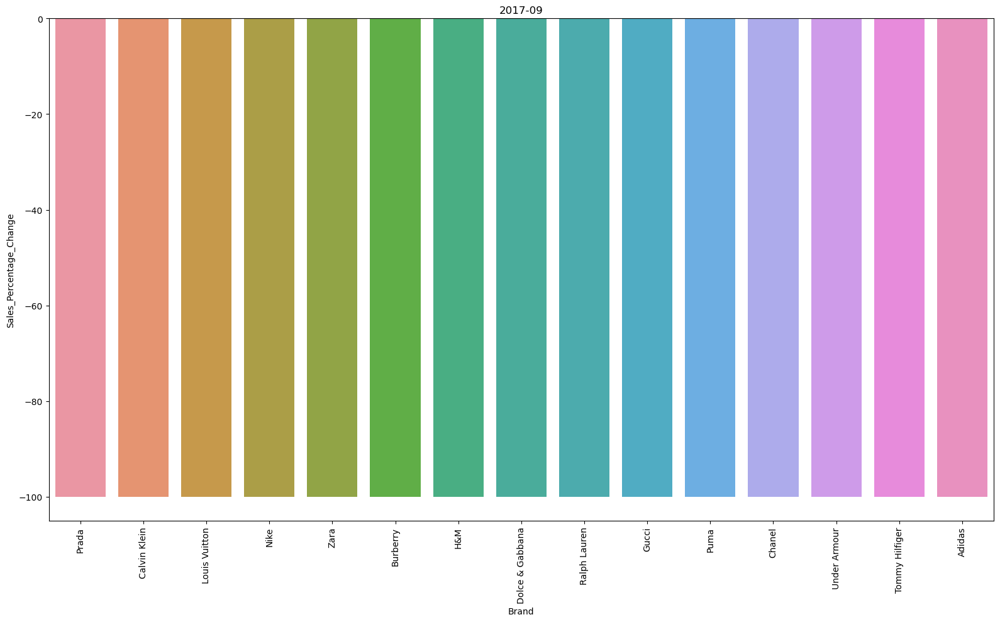

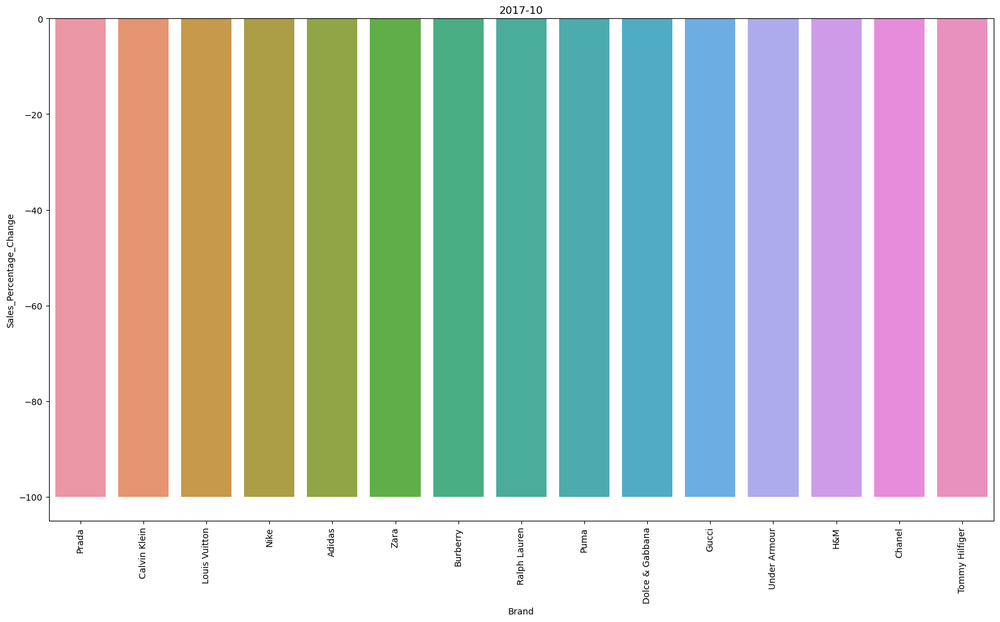

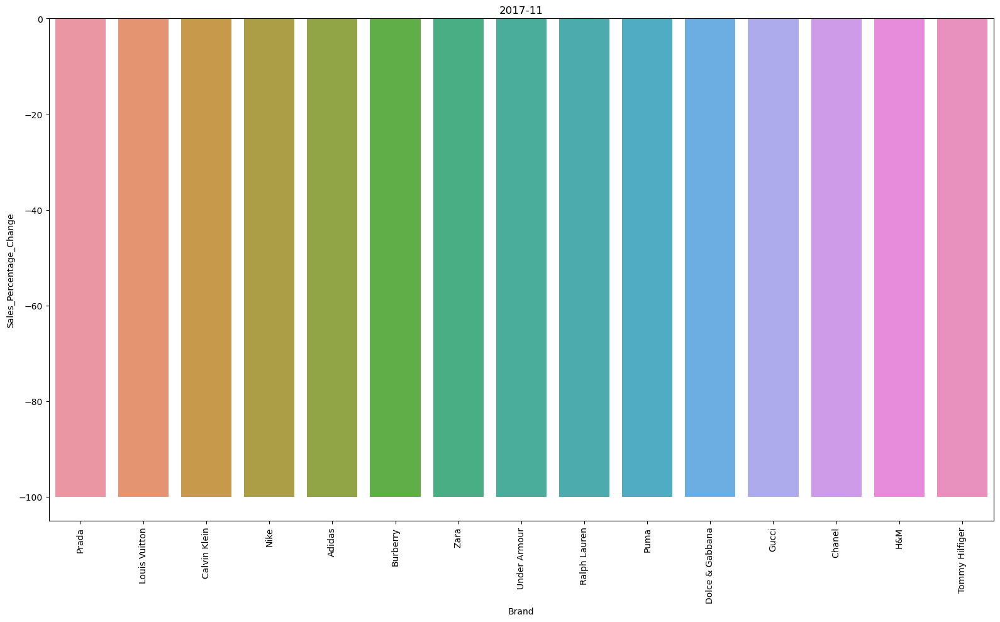

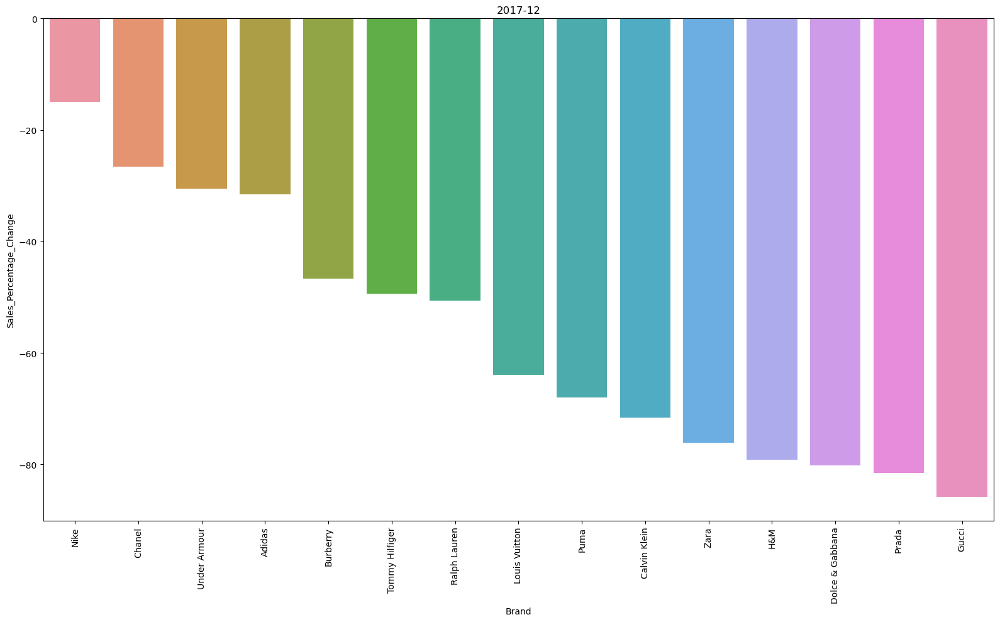

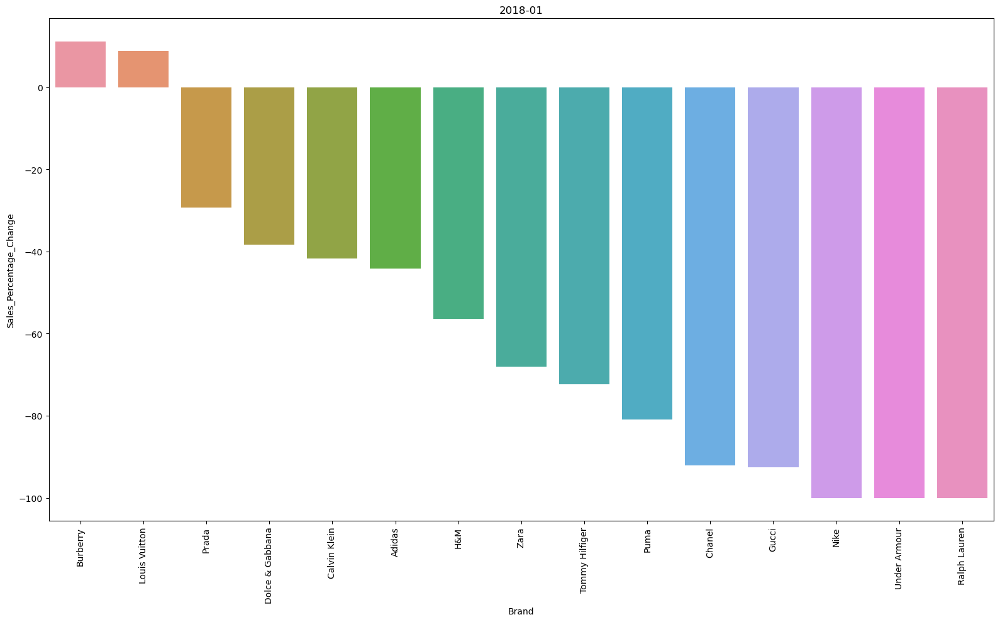

...

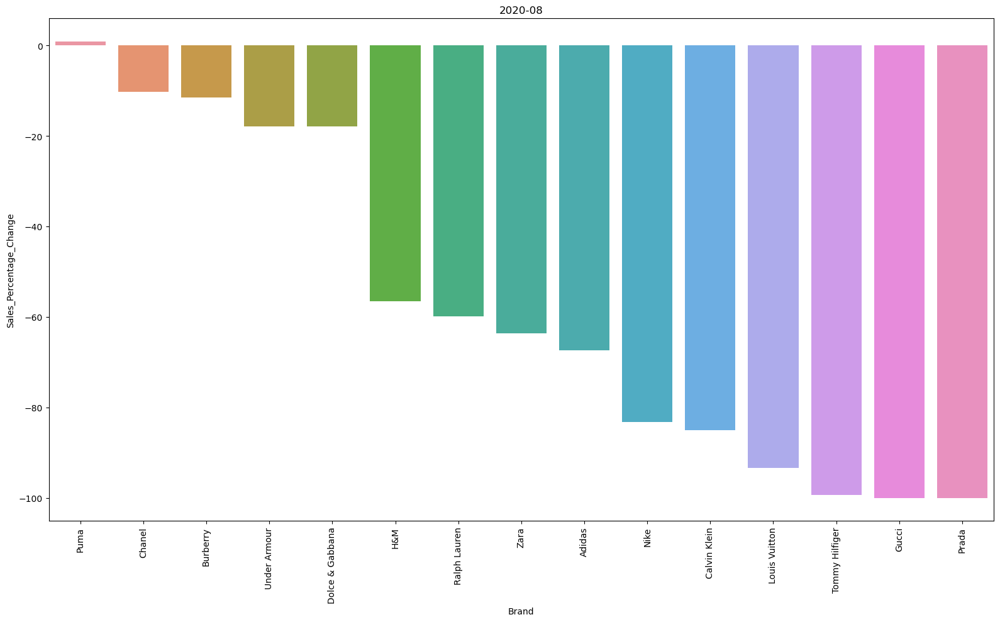

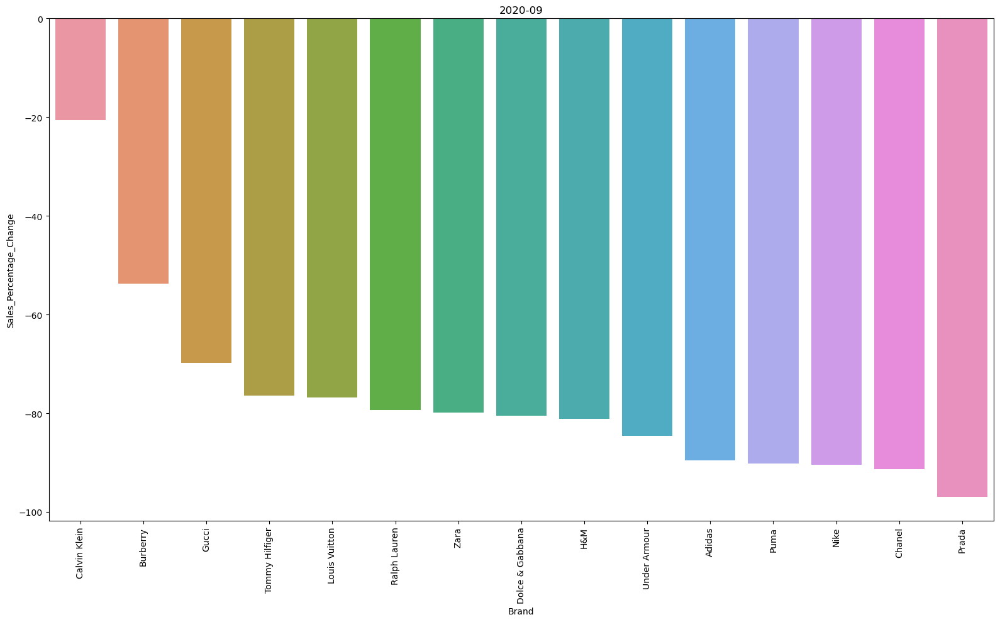

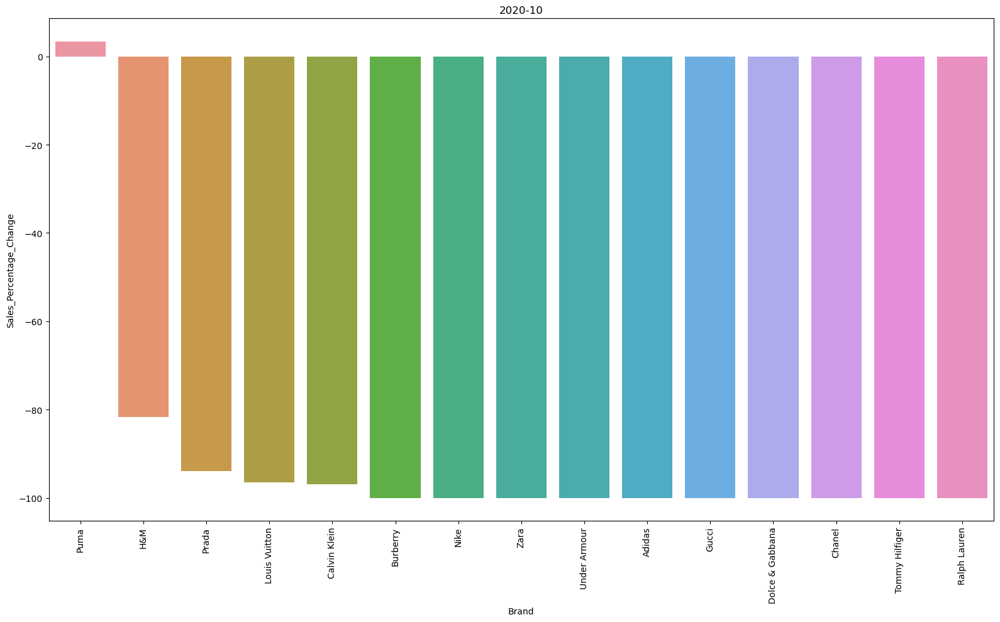

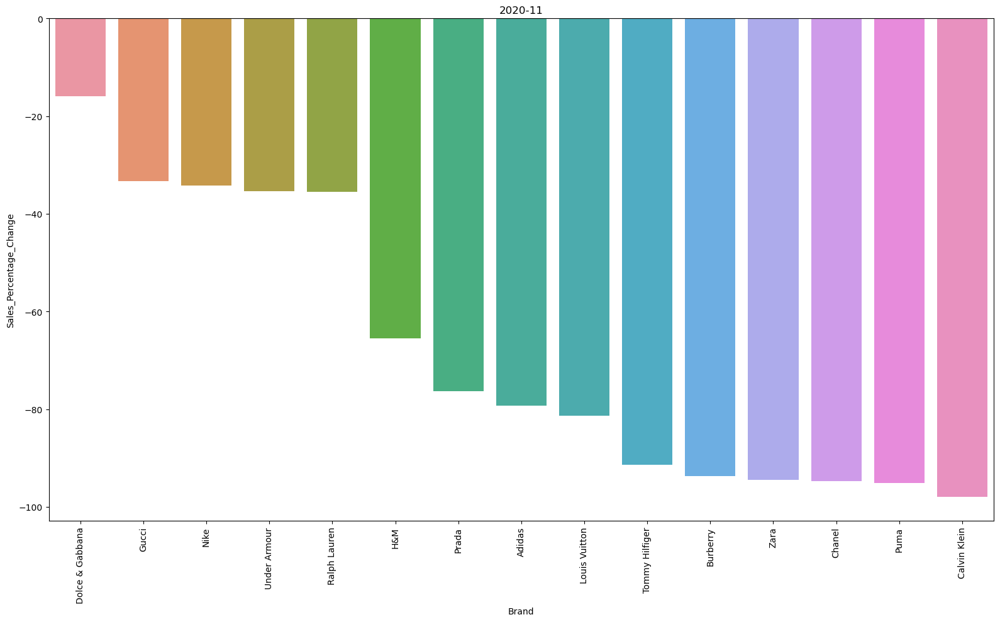

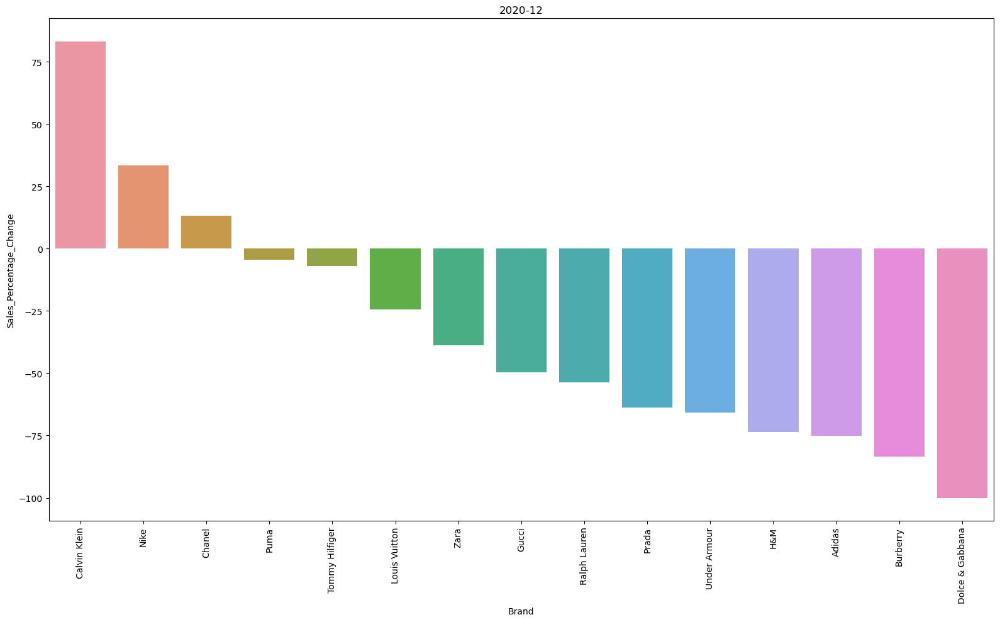

In [22]:
plot_sales(temp_brand)

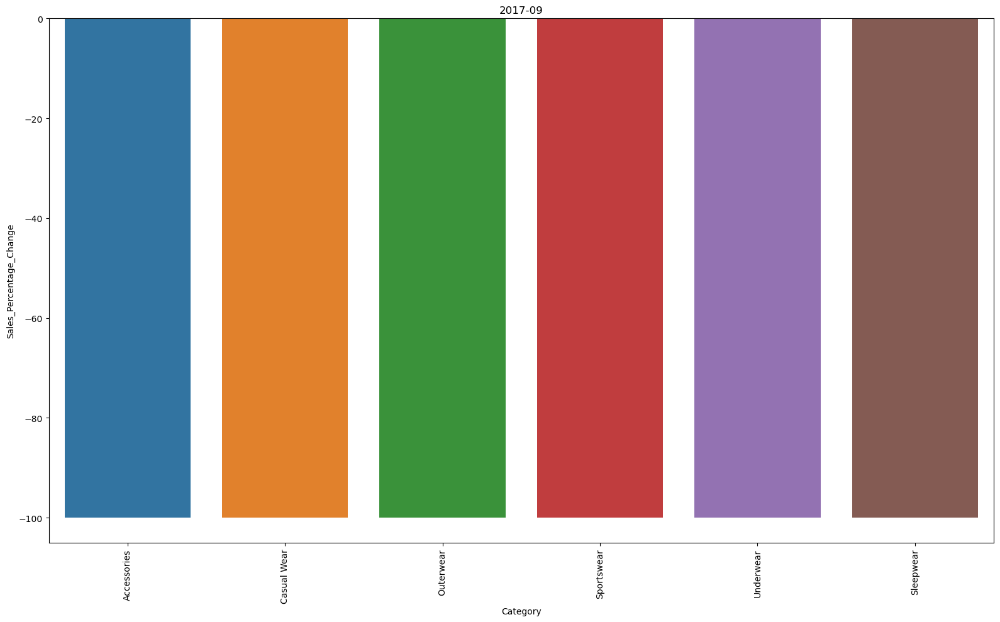

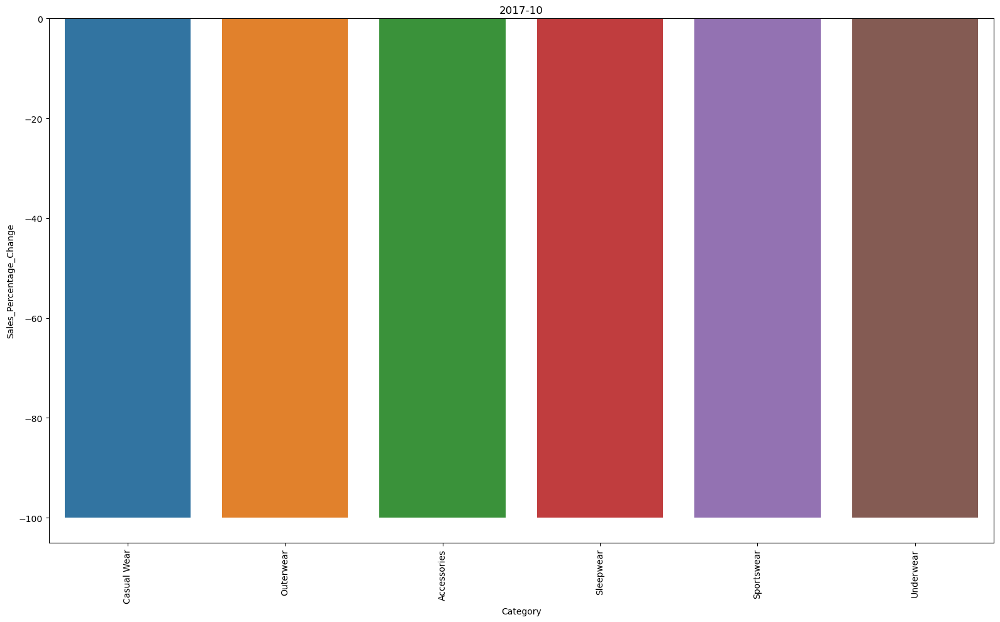

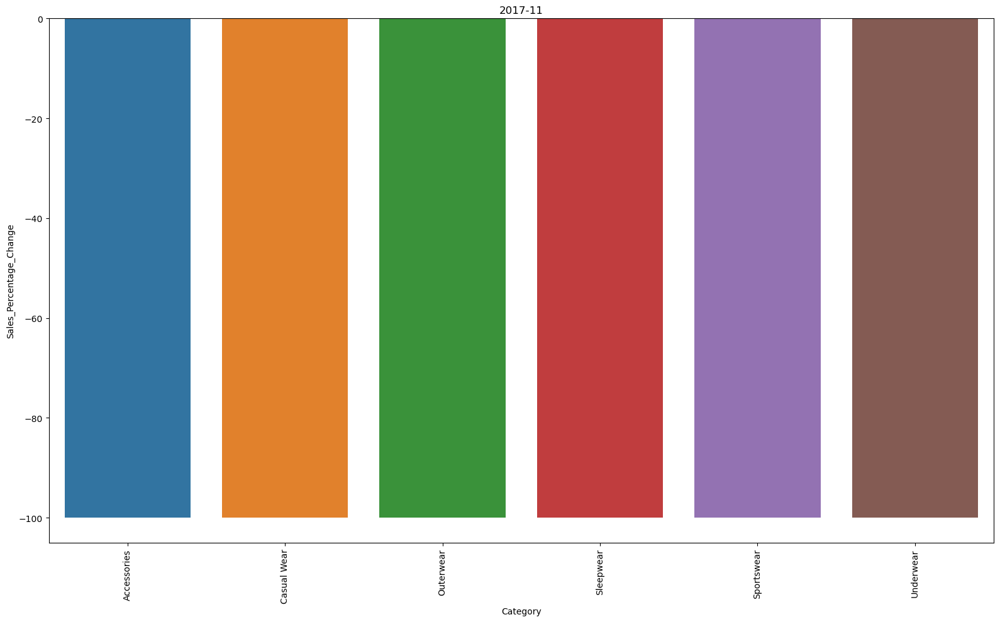

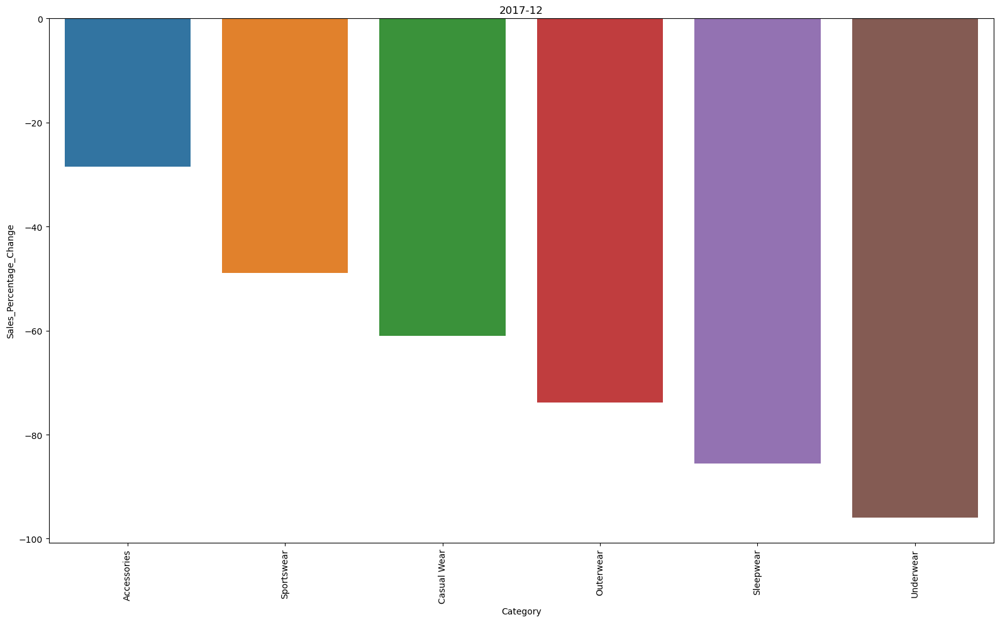

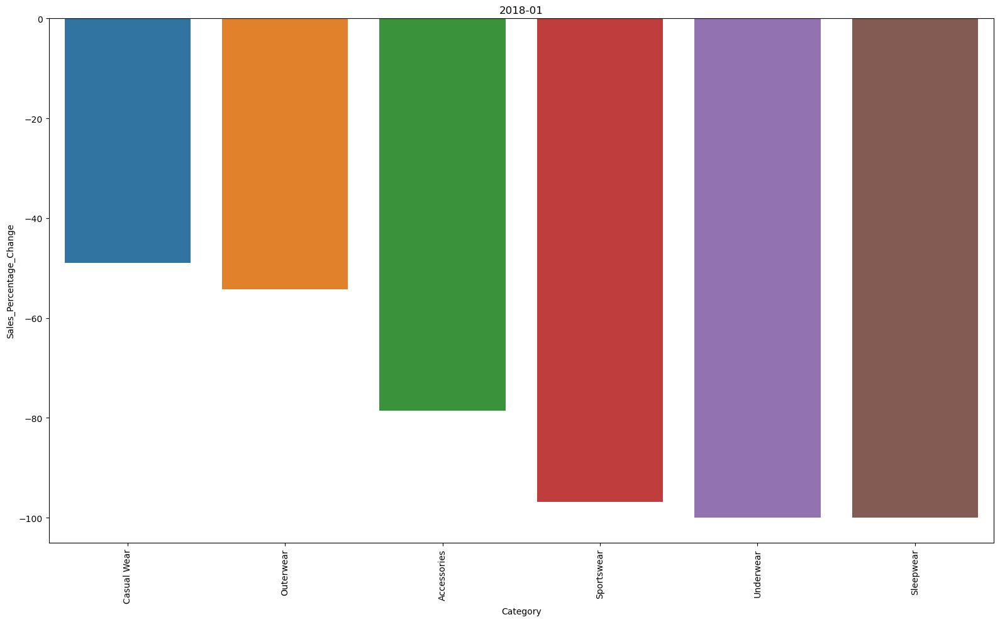

...

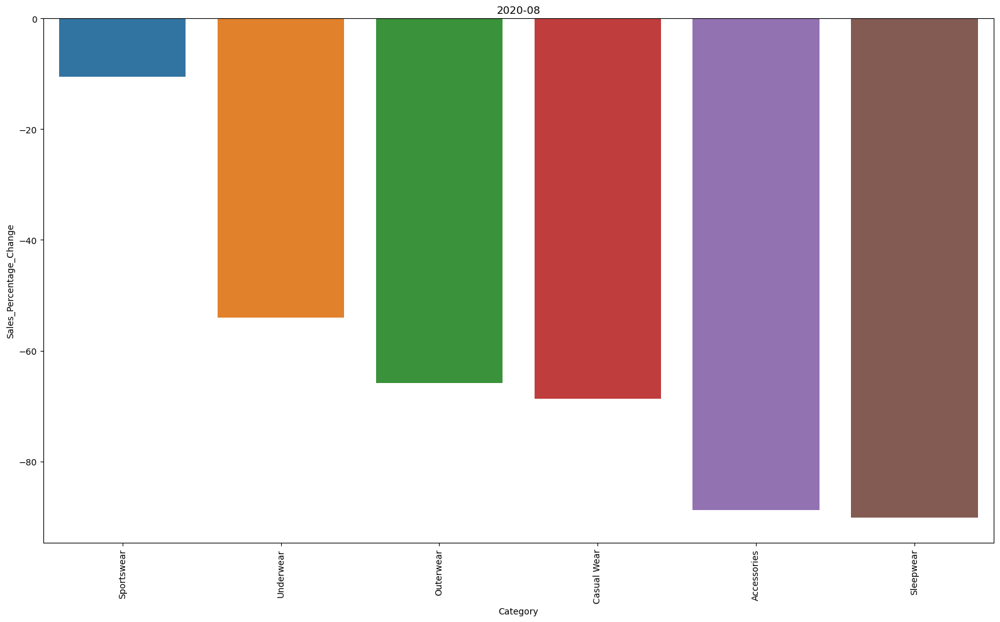

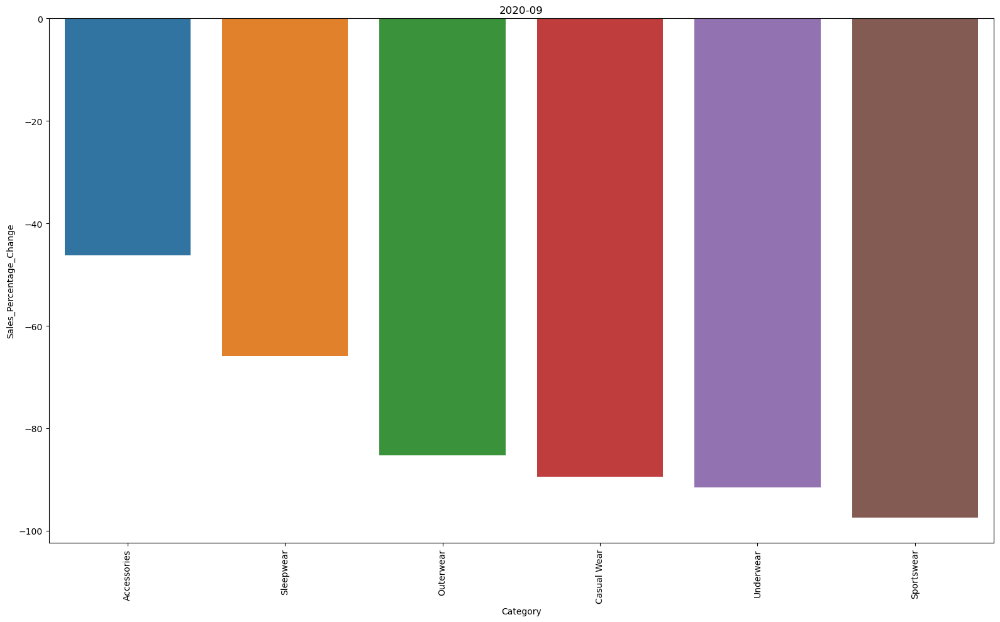

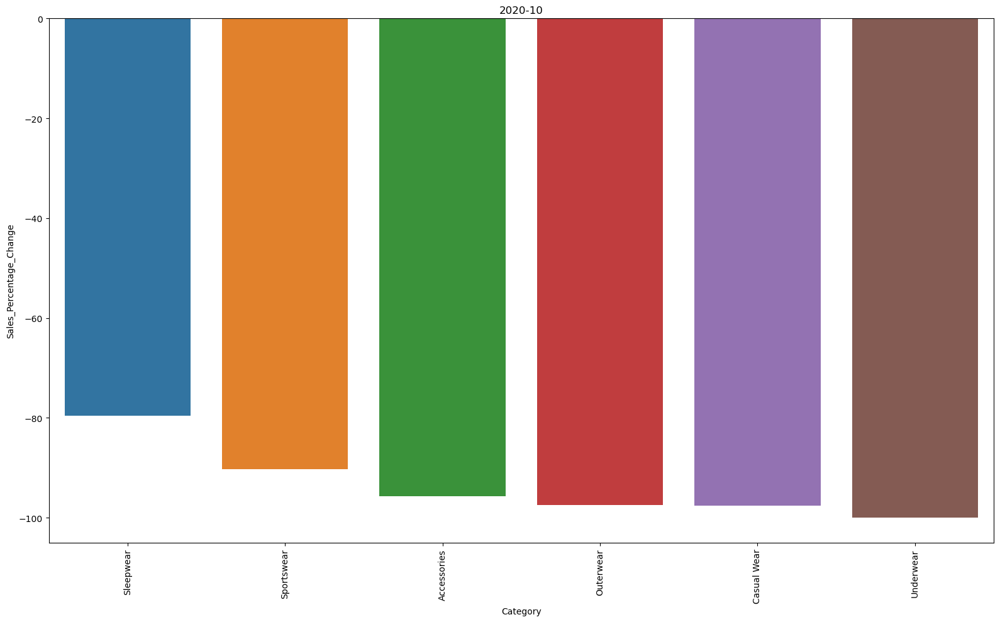

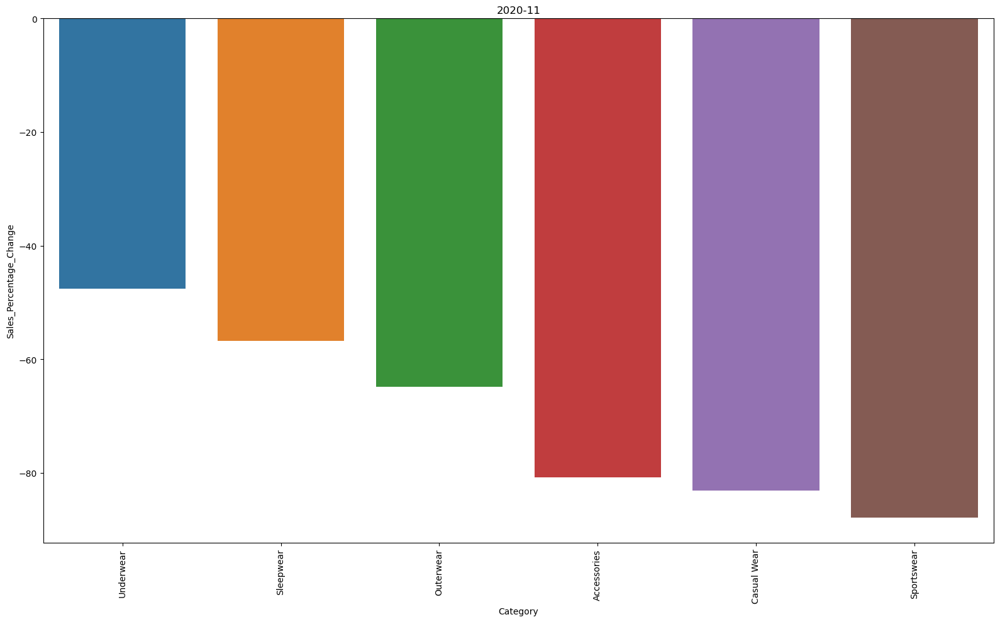

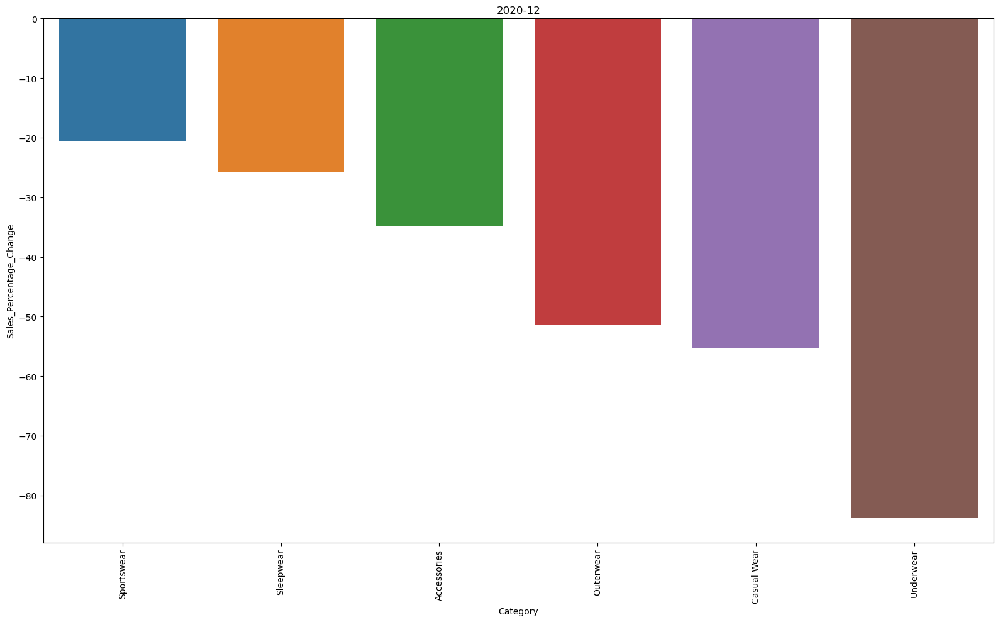

In [23]:
plot_sales(temp_category)

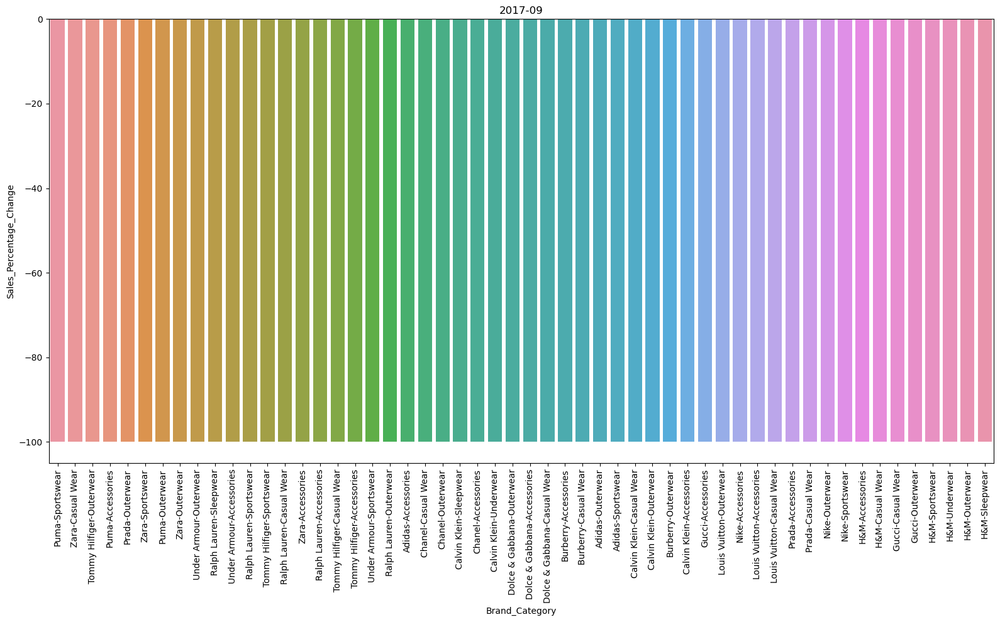

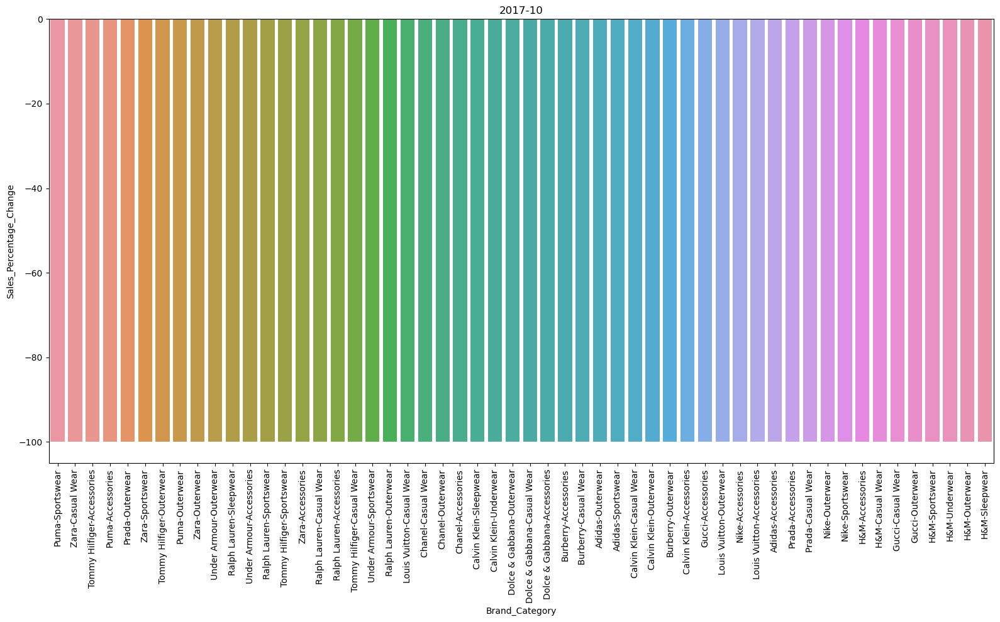

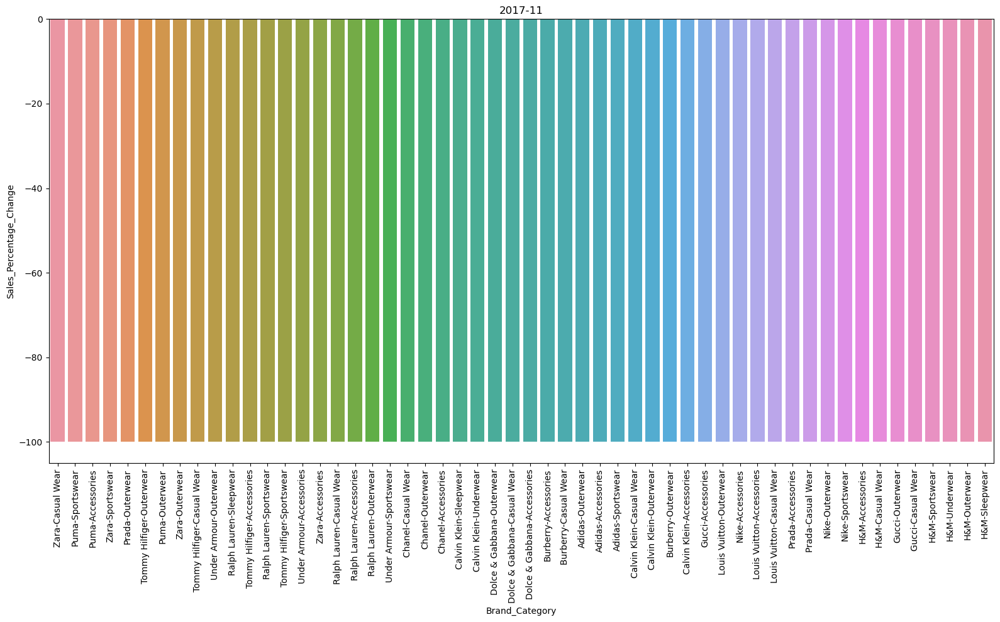

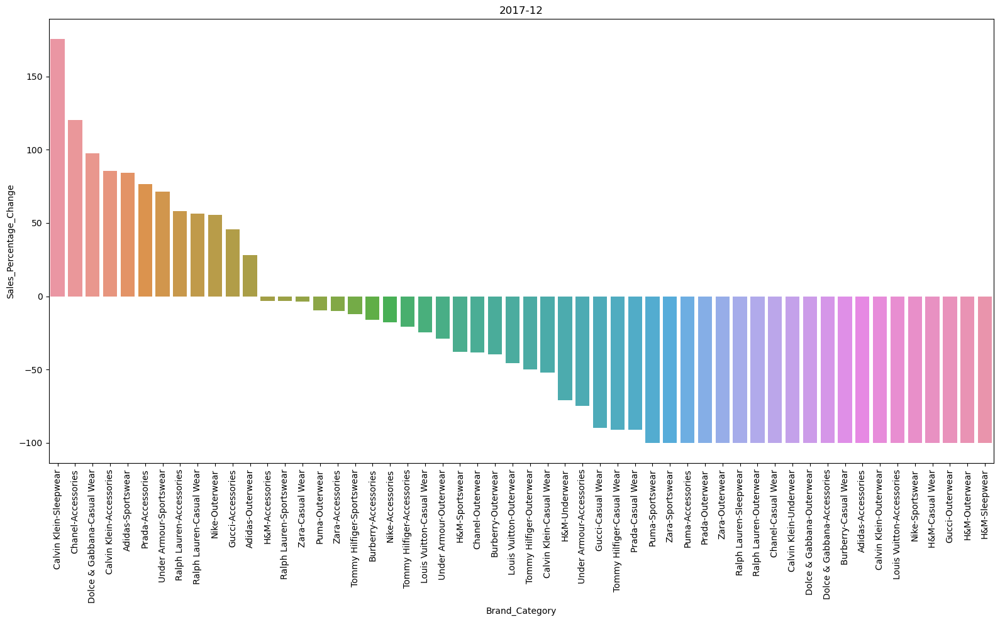

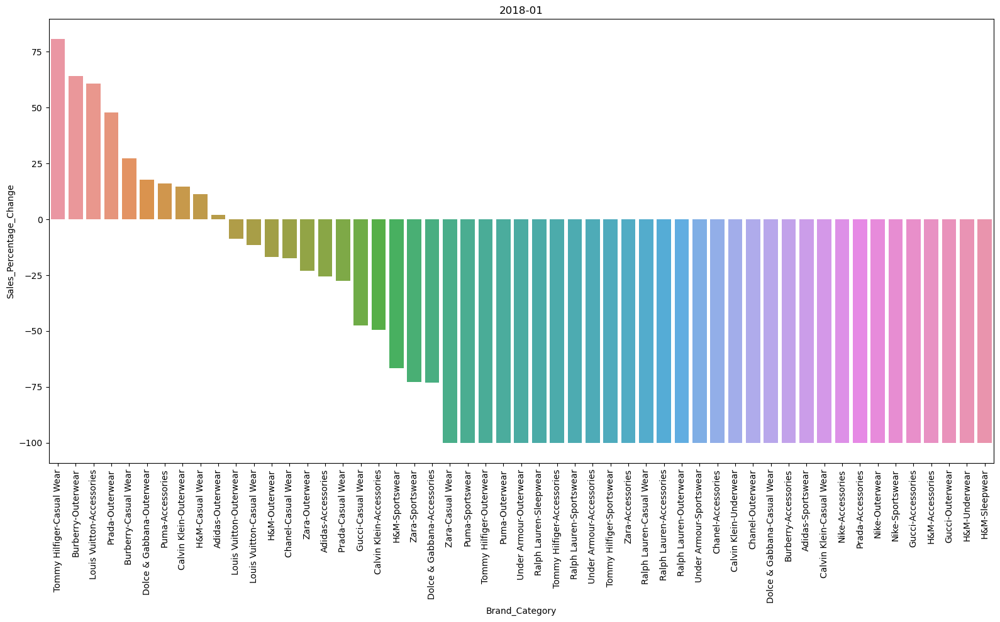

...

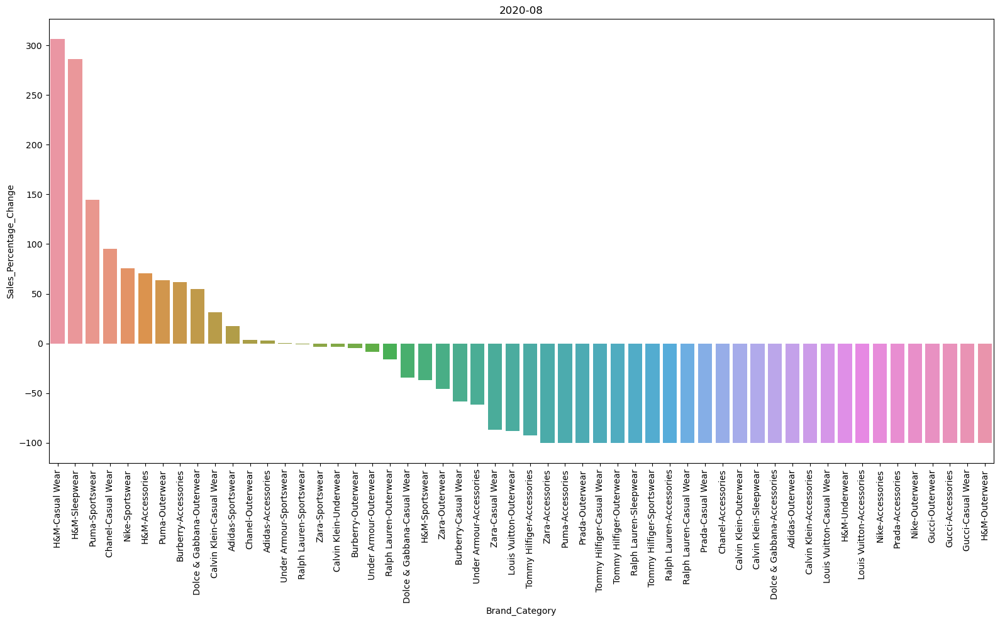

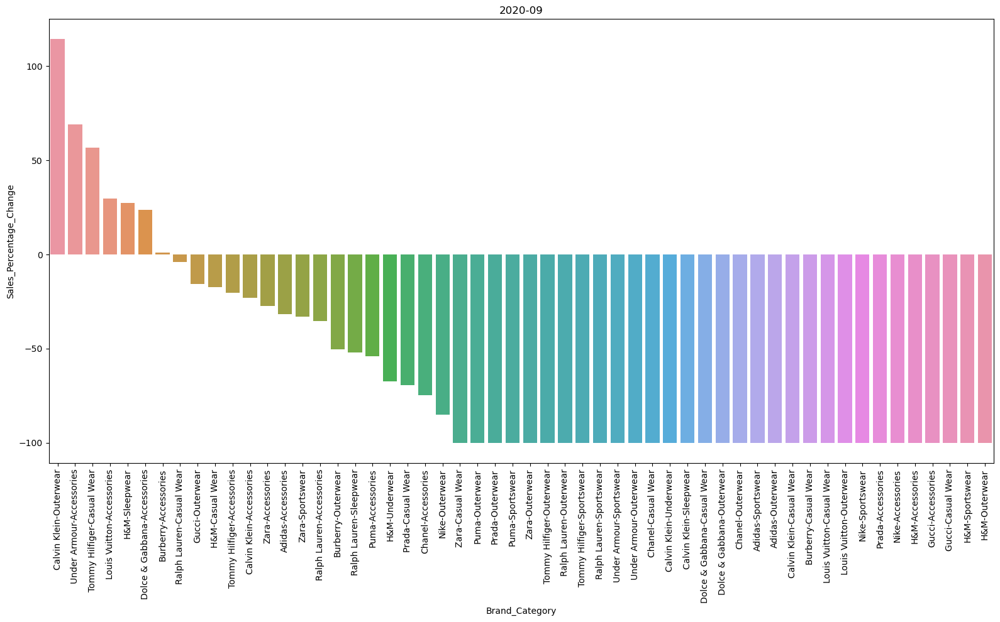

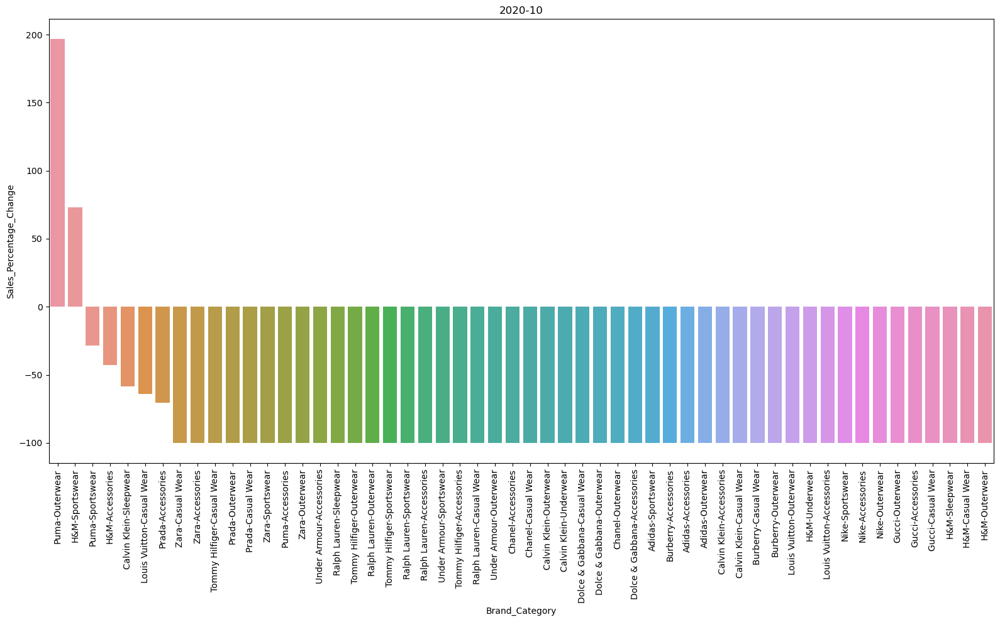

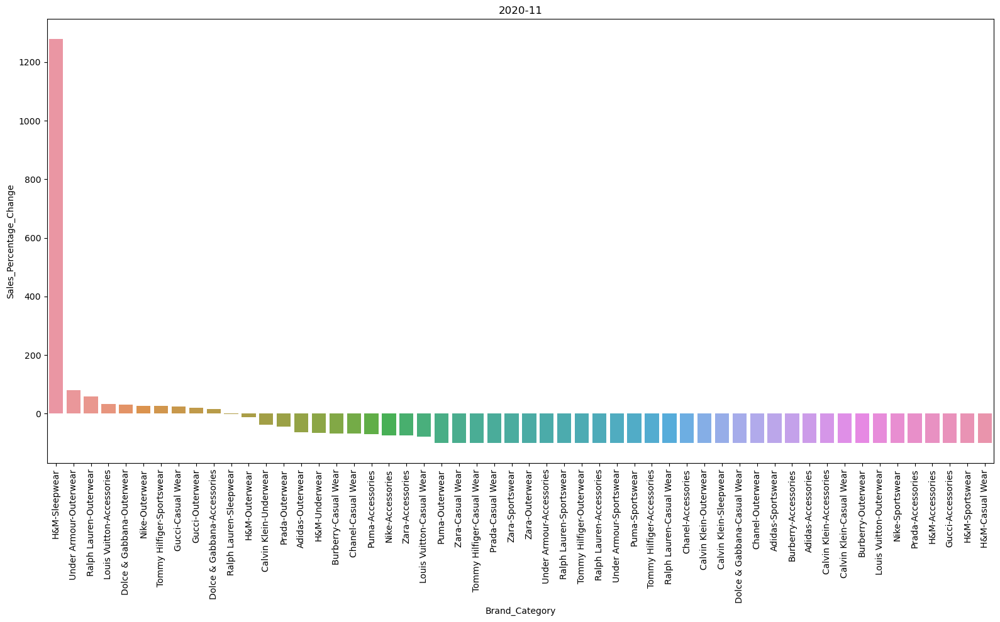

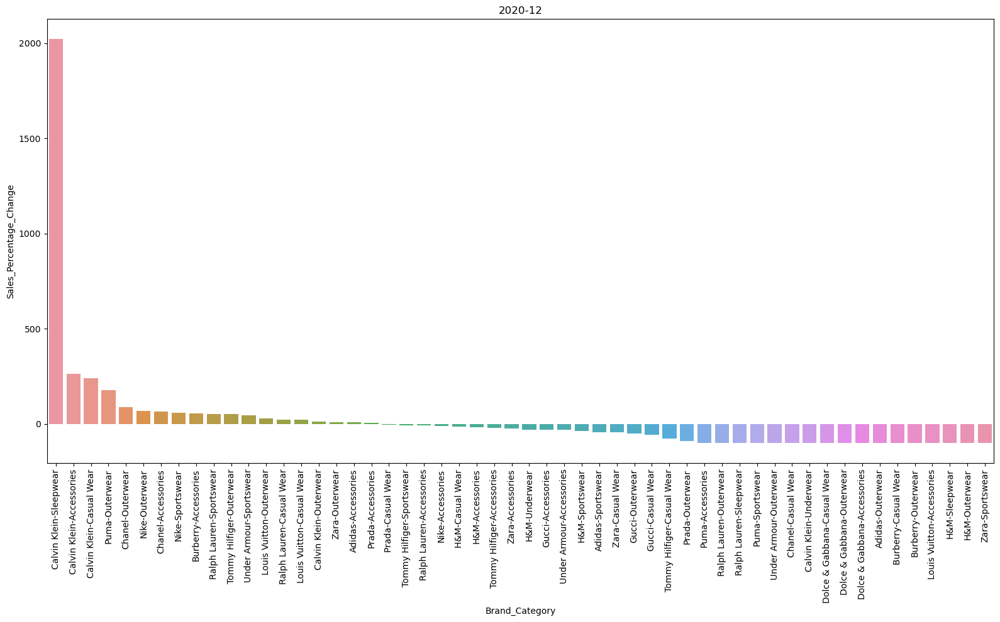

In [24]:
plot_sales(temp_brand_category)

### HTML PLOTS

In [17]:
import plotly.graph_objects as go

def html_plots(df,file_name):
    df = df.sort_values(by='Sales_Percentage_Change', ascending=False)
    year_month = sorted(df.Purchase_Year_Month.unique()) # storing each month-year combination
    
    # Create an empty list to store plot divs
    plot_divs = []
    
    # Iterate over each year-month combination
    for i in year_month:
        # Create a new figure for each plot
        temp = df[df.Purchase_Year_Month==i]
        fig = go.Figure(data=[go.Bar(x=temp[temp.columns[0]], y=temp['Sales_Percentage_Change'])])
        
        # Update layout
        fig.update_layout(title=str(i), xaxis_title=temp.columns[0], yaxis_title='Sales % Change')
        fig.show()
        # Convert the plot to HTML div
        plot_div = fig.to_html(full_html=False)
        
        # Append the plot div to the list
        plot_divs.append(plot_div)
    
    # Concatenate all plot divs to create a single HTML document
    combined_plot_divs = "".join(plot_divs)
    
    # Write the combined plot divs to a single HTML file
    with open(file_name+'.html', "w") as file:
        file.write(combined_plot_divs)

# Example usage:
# plot_sales2(df, "sales_plots_combined.html")


In [18]:
html_plots(temp_brand_category,'brand_category_Sales%')

In [19]:
# --------------------------------------------------------------------------------------------------------------------

In [20]:
df_orders.head()

,OrderID,CustomerID,ProductID,Purchase_Date,Quantity,Original_Price,Discount,Discounted_Price,PromotionID,Brand,Category,Total_Amount
0,1,1564,7088,2017-09-02,1,110.0,0,110.0,NaN,Zara,Accessories,110.0
1,1,1564,238,2017-09-02,2,60.0,5,57.0,NaN,Puma,Sportswear,114.0
2,1,1564,8669,2017-09-02,1,210.0,15,178.5,NaN,Ralph Lauren,Sleepwear,178.5
3,2,1471,3570,2017-09-02,3,330.0,0,330.0,NaN,Louis Vuitton,Outerwear,990.0
4,2,1471,396,2017-09-02,1,130.0,10,117.0,NaN,Adidas,Sportswear,117.0


In [21]:
df_promotions.head()

,PromotionID,Brand,Category,DiscountPercentage,StartDate,EndDate
0,1,Nike,Accessories,55,2017-12-08,2017-12-15
1,2,Nike,Accessories,30,2017-12-08,2017-12-15
2,3,Nike,Accessories,20,2017-12-01,2017-12-08
3,4,Nike,Accessories,25,2017-12-01,2017-12-08
4,5,Nike,Accessories,20,2017-12-08,2017-12-15
